## [TFT 게임 각 서버 Top10 플레이어들의 매치 데이터 분석]


### 초기 설정


In [1]:
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import folium
import seaborn as sns
import json
import plotly.express as px
from itertools import combinations
from collections import defaultdict
from folium.plugins import HeatMap
from matplotlib import font_manager
from folium.plugins import MarkerCluster
from folium import GeoJson
from folium import LinearColormap
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

font_path = "C:/Windows/Fonts/malgun.ttf"
font_family = font_manager.FontProperties(fname=font_path).get_name()
plt.rcParams["font.family"] = font_family
plt.rcParams["axes.unicode_minus"] = False
plt.rc("font", family="Malgun Gothic")

pd.options.display.max_rows = 1000

In [2]:
%matplotlib inline

### 사용할 데이터 프레임 생성


In [3]:
player = pd.read_csv("data/player.csv")
match = pd.read_csv("data/match.csv")
match_player = pd.read_csv("data/match_player.csv")
match_trait = pd.read_csv("data/match_trait.csv")
match_unit = pd.read_csv("data/match_unit.csv")

In [4]:
match_trait["name"] = match_trait["name"]

### 한글화 처리


#### 한글화 준비


In [5]:
file_path = "./json/ko_kr.json"
with open(file_path, "r") as json_file:
    data_dragon = json.load(json_file)

# 아이템, 유닛, 특성 정보의 데이터프레임
items = pd.DataFrame(data_dragon["items"])
set9 = pd.DataFrame(data_dragon["sets"])["9"]
set9_units = pd.DataFrame(set9["champions"])
set9_traits = pd.DataFrame(set9["traits"])

# 각 데이터프레임으로부터 딕셔너리 생성
item_names = dict(zip(items["apiName"].str.lower(), items["name"].str.lower()))
unit_names = dict(
    zip(set9_units["apiName"].str.lower(), set9_units["name"].str.lower())
)
trait_names = dict(
    zip(set9_traits["apiName"].str.lower(), set9_traits["name"].str.lower())
)

#### 한글화 적용


In [6]:
match_trait["name"] = match_trait["name"].apply(lambda x: trait_names[x.lower()])
match_unit["name"] = match_unit["name"].apply(lambda x: unit_names[x.lower()])
match_unit["item1"] = match_unit["item1"].apply(
    lambda x: item_names[x.lower()] if isinstance(x, str) else ""
)
match_unit["item2"] = match_unit["item2"].apply(
    lambda x: item_names[x.lower()] if isinstance(x, str) else ""
)
match_unit["item3"] = match_unit["item3"].apply(
    lambda x: item_names[x.lower()] if isinstance(x, str) else ""
)

### 데이터 전처리, 이상치 검출


#### Tukey outlier detection


In [7]:
def calculate_fence(data, coef=1.5):
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    iqr = q3 - q1
    lower_fence = q1 - coef * iqr
    upper_fence = q3 + coef * iqr
    return lower_fence, upper_fence

#### 게임 길이를 기반으로 이상치 검출


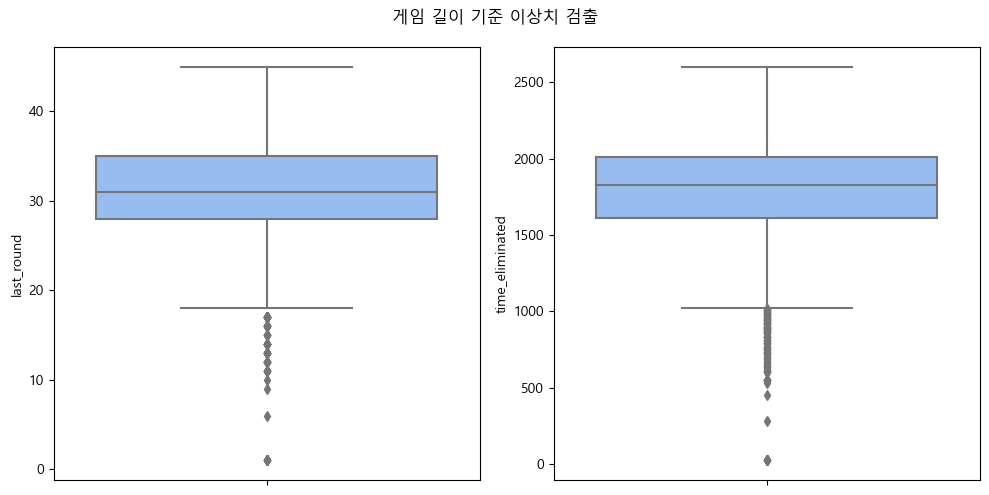

In [8]:
# 게임을 제대로 플레이 하지 않은 경기 확인
fig = plt.figure(figsize=(10, 5))
fig.suptitle("게임 길이 기준 이상치 검출")

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
sns.boxplot(match_player, y="last_round", color="#8BF", ax=ax1)
sns.boxplot(match_player, y="time_eliminated", color="#8BF", ax=ax2)

fig.tight_layout()
plt.show()

In [9]:
last_round_lfence, last_round_ufence = calculate_fence(match_player["last_round"])
time_eliminated_lfence, time_eliminated_ufence = calculate_fence(
    match_player["time_eliminated"]
)

outlier_condition = (
    (match_player["last_round"] > last_round_ufence)
    | (match_player["last_round"] < last_round_lfence)
    | (match_player["time_eliminated"] > time_eliminated_ufence)
    | (match_player["time_eliminated"] < time_eliminated_lfence)
)
outlier_match_player = match_player[outlier_condition]

# 유닛을 한마리도 뽑지 않은 플레이어가 존재하기 때문에 left 조인
outlier_match_player = outlier_match_player.merge(
    match_unit, how="left", left_on="match_player_id", right_on="match_player_id"
)

outlier_match_player = outlier_match_player.loc[
    :,
    [
        "match_player_id",
        "last_round",
        "level",
        "placement",
        "time_eliminated",
        "name",
        "tier",
    ],
]
outlier_match_player = outlier_match_player.groupby(by="match_player_id").agg(
    {
        "last_round": "first",
        "level": "first",
        "placement": "first",
        "time_eliminated": "first",
        "name": list,
        "tier": "mean",
    }
)

# t-헥스를 뽑은 플레이어 제외
outlier_player = outlier_match_player[
    outlier_match_player["name"].apply(
        lambda champ_list: True if "t-헥스" not in champ_list else False
    )
]
# 결과 반영
# outlier_player
# 이상치 플레이어 데이터 제거, 같이 플레이 한 플레이어들의 데이터는 유지
preprocessed_match_player = match_player[
    ~match_player["match_player_id"].isin(outlier_player.index)
]
preprocessed_match_unit = match_unit[
    ~match_unit["match_player_id"].isin(outlier_player.index)
]
preprocessed_match_trait = match_trait[
    ~match_trait["match_player_id"].isin(outlier_player.index)
]

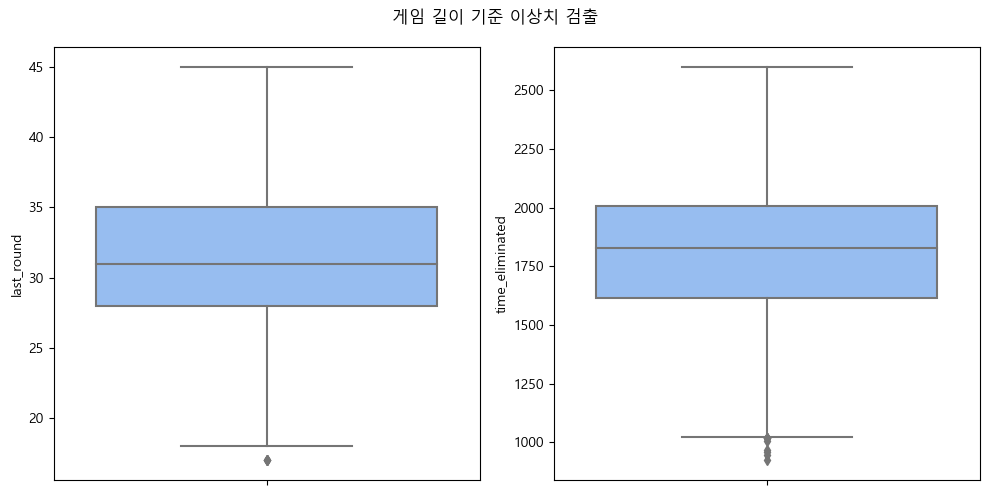

In [10]:
# 게임을 제대로 플레이 하지 않은 경기 확인
fig = plt.figure(figsize=(10, 5))
fig.suptitle("게임 길이 기준 이상치 검출")

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
sns.boxplot(preprocessed_match_player, y="last_round", color="#8BF", ax=ax1)
sns.boxplot(preprocessed_match_player, y="time_eliminated", color="#8BF", ax=ax2)

fig.tight_layout()
plt.show()

#### 유닛 비용의 합으로 이상치 검출


In [11]:
# preprocessed_match_unit = preprocessed_match_unit.loc[:,['match_player_id', 'name', 'rarity', 'tier']]

# 하이머딩거 포탑은 코스트가 없기 때문에 제외
preprocessed_match_unit = preprocessed_match_unit[
    preprocessed_match_unit["name"] != "최첨단 포탑"
]

# 특수 유닛 제외
preprocessed_match_unit = preprocessed_match_unit[
    preprocessed_match_unit["rarity"] <= 6
]

# 유닛 코스트를 계산하기 위한 전처리를 수행
rarity_to_cost = {0: 1, 1: 2, 2: 3, 4: 4, 6: 5}
preprocessed_match_unit["tier"] = preprocessed_match_unit["tier"].apply(
    lambda x: 3 if x >= 4 else x
)
preprocessed_match_unit["single_cost"] = preprocessed_match_unit.loc[:, "rarity"].apply(
    lambda x: rarity_to_cost[x]
)
preprocessed_match_unit["cost"] = preprocessed_match_unit.loc[:, "single_cost"] * (
    3 ** (preprocessed_match_unit.loc[:, "tier"] - 1)
)

# 데이터 가공
revised_match_unit = preprocessed_match_unit.groupby(by="match_player_id").agg(
    {"name": list, "cost": "sum", "tier": "mean"}
)
revised_match_unit["unit_count"] = revised_match_unit["name"].apply(lambda x: len(x))
revised_match_unit = revised_match_unit.merge(
    preprocessed_match_player.loc[
        :, ["match_player_id", "placement", "last_round", "level", "time_eliminated"]
    ],
    how="inner",
    left_on="match_player_id",
    right_on="match_player_id",
)
revised_match_unit.rename(
    columns={"cost": "cost_sum", "tier": "avg_tier"}, inplace=True
)
# revised_match_unit[['cost_sum', 'avg_tier', 'unit_count', 'placement']].head(24)

In [12]:
fig = px.box(
    revised_match_unit,
    y="cost_sum",
    title="유닛 비용의 합 기준 이상치 검출",
    color_discrete_sequence=["#58F"],
    template="plotly",
)
fig

In [13]:
outlier_player = revised_match_unit[revised_match_unit["cost_sum"] <= 18][
    "match_player_id"
]

# 이상치 플레이어 데이터 제거, 같이 플레이 한 플레이어들의 데이터는 유지
print(
    "제거 전:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)
preprocessed_match_player = preprocessed_match_player[
    ~preprocessed_match_player["match_player_id"].isin(outlier_player)
]
preprocessed_match_unit = preprocessed_match_unit[
    ~preprocessed_match_unit["match_player_id"].isin(outlier_player)
]
preprocessed_match_trait = preprocessed_match_trait[
    ~preprocessed_match_trait["match_player_id"].isin(outlier_player)
]
revised_match_unit = revised_match_unit[
    ~revised_match_unit["match_player_id"].isin(outlier_player)
]
print(
    "제거 후:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)

제거 전: (31227, 7) (252505, 10) (335508, 7) (31215, 9)
제거 후: (31190, 7) (252366, 10) (335298, 7) (31178, 9)


In [14]:
fig = px.box(
    revised_match_unit,
    y="cost_sum",
    title="유닛 비용의 합 기준 이상치 검출",
    color_discrete_sequence=["#58F"],
    template="plotly",
)
fig

#### 게임 도중 3성 유닛을 뽑기 위해 다른 유닛들을 판 데이터 제거


In [15]:
outlier_player = revised_match_unit[(revised_match_unit["unit_count"] < 5)][
    "match_player_id"
]
# 이상치 플레이어 데이터 제거, 같이 플레이 한 플레이어들의 데이터는 유지
print(
    "제거 전:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)
preprocessed_match_player = preprocessed_match_player[
    ~preprocessed_match_player["match_player_id"].isin(outlier_player)
]
preprocessed_match_unit = preprocessed_match_unit[
    ~preprocessed_match_unit["match_player_id"].isin(outlier_player)
]
preprocessed_match_trait = preprocessed_match_trait[
    ~preprocessed_match_trait["match_player_id"].isin(outlier_player)
]
revised_match_unit = revised_match_unit[
    ~revised_match_unit["match_player_id"].isin(outlier_player)
]
print(
    "제거 후:",
    preprocessed_match_player.shape,
    preprocessed_match_unit.shape,
    preprocessed_match_trait.shape,
    revised_match_unit.shape,
)

제거 전: (31190, 7) (252366, 10) (335298, 7) (31178, 9)
제거 후: (31140, 7) (252192, 10) (335091, 7) (31128, 9)


### 각 서버 사용자 분포


#### 서버에 해당하는 국가 매칭


In [16]:
SERVER_INFO = {
    "BR1": ("Brazil",),
    "EUN1": ("Sweden", "Norway", "Estonia", "Latvia"),
    "EUW1": ("Spain", "United Kingdom", "Belgium"),
    "JP1": ("Japan",),
    "KR": ("Korea",),
    "LA1": ("Mexico", "Columbia", "Peru"),
    "LA2": ("Bolivia", "Uruguay", "Chile"),
    "NA1": ("United States", "Canada"),
    "OC1": ("Australia", "New Zealand"),
    "PH2": ("Philippines",),
    "RU": ("Russia",),
    "SG2": ("Singapore", "Malaysia", "Indonesia"),
    "TH2": ("Thailand",),
    "TR1": ("Turkey",),
    "TW2": ("Taiwan", "Hong Kong", "Macao"),
    "VN2": ("Vietnam",),
}

#### 지도 시각화할 데이터프레임을 생성


In [17]:
indexed_player_count = (
    player.groupby(by=["continent", "region"]).count()["puuid"].to_frame()
)
player_count = indexed_player_count.reset_index().sort_values("puuid", ascending=True)
player_count.rename(columns={"puuid": "count"}, inplace=True)

# 새로운 데이터를 담을 리스트 생성
new_data = []

# 각 지역의 국가 정보를 확장하여 리스트에 추가
for region, puuid in player_count.loc[:, ["region", "count"]].to_numpy():
    countries = SERVER_INFO.get(region, ())
    for country in countries:
        new_data.append((region, puuid, country))

# 새로운 데이터프레임 생성
country_player_count = pd.DataFrame(new_data, columns=["region", "count", "country"])

#### 서버별 사용자 수 시각화


In [18]:
fig = px.bar(
    player_count,
    x="region",
    y="count",
    text_auto=".3s",
    color="continent",
    title="서버별 사용자 수",
    color_discrete_sequence=px.colors.sequential.Turbo[1::1],
)
fig.update_traces(
    textfont_size=12, textangle=0, textposition="outside", cliponaxis=False
)
fig.show()

#### 서버별 사용자 분포 지도 시각화


In [19]:
# GeoJSON 파일 URL
url = "http://geojson.xyz/naturalearth-3.3.0/ne_50m_admin_0_countries.geojson"

# GeoJSON 파일을 GeoDataFrame으로 읽어옴
countries_geo = gpd.read_file(url)

In [20]:
# 기본 맵을 생성
map = folium.Map(location=(30, 10), zoom_start=2, tiles="cartodb positron")

bins = np.linspace(
    country_player_count["count"].min(), country_player_count["count"].max(), 16
)

# Choropleth Layer
choropleth_layer = folium.Choropleth(
    geo_data=countries_geo,
    data=country_player_count,
    columns=["country", "count"],
    key_on="feature.properties.name",
    fill_color="PuRd",
    fill_opacity=0.7,
    line_opacity=0.3,
    nan_fill_color="white",
    legend_name="Player count",
    bins=bins,
)
choropleth_layer.add_to(map)

# 국가로 인덱스된 데이터프레임을 생성
player_data_indexed = country_player_count.set_index("country")

# 툴팁에 표시할 내용을 geojson.data에 추가
for s in choropleth_layer.geojson.data["features"]:
    region_name = s["properties"]["name"]
    if region_name not in player_data_indexed.index:
        count_value = ""
        server_value = ""
    else:
        count_value = str(
            player_data_indexed.loc[region_name, "count"]
        )  # Convert to str
        server_value = str(
            player_data_indexed.loc[region_name, "region"]
        )  # Convert to str
    s["properties"]["count"] = count_value
    s["properties"]["server"] = server_value

tooltip = folium.GeoJsonTooltip(fields=["name", "server", "count"], labels=True)
choropleth_layer.geojson.add_child(tooltip)

folium.TileLayer("openstreetmap").add_to(map)
folium.LayerControl().add_to(map)
map

### 연관 규칙 분석


#### 특성 별 연관규칙 분석


In [21]:
# 전체 티어가 1인 특성과 현제 티어가 0인 특성 제외
revised_match_trait = preprocessed_match_trait[preprocessed_match_trait["tier_total"] > 1]
revised_match_trait = revised_match_trait[revised_match_trait["tier_current"] > 0]
revised_match_trait = revised_match_trait.groupby("match_player_id")[["name"]].agg(list)

In [22]:
# 버전 정보를 얻기 위해서 병합 작업을 수행
merged_match_trait = match.merge(
    preprocessed_match_player, how="inner", left_on="match_id", right_on="match_id"
)
merged_match_trait = merged_match_trait.merge(
    revised_match_trait,
    how="inner",
    left_on="match_player_id",
    right_on="match_player_id",
)

# 가장 최신 버전에 해당하는 기록만 남김
latest_match_trait = merged_match_trait[
    (merged_match_trait["version_major"] == 13)
    & (merged_match_trait["version_minor"] == 15)
    & (merged_match_trait["version_patch"] == 524)
]
latest_match_trait = merged_match_trait.loc[:, ["match_player_id", "name"]]

# 전처리 후 지지도 계산
te = TransactionEncoder()
te_result = te.fit_transform(latest_match_trait["name"])
td_df = pd.DataFrame(te_result, columns=te.columns_)
freq_items = apriori(td_df, min_support=0.05, use_colnames=True)

# freq_items.sort_values('support', ascending=False).head(15)

# 연관규칙 분석
rules = association_rules(freq_items, metric="confidence", min_threshold=0.8)
rules["antecedents_str"] = rules["antecedents"].apply(lambda x: ",".join(list(x)))
rules["consequents_str"] = rules["consequents"].apply(lambda x: ",".join(list(x)))
# rules.head()

In [111]:
# 점 그래프 생성
fig = px.scatter(
    rules,
    x="support",
    y="confidence",
    size="lift",
    color="lift",
    custom_data=["antecedents_str", "consequents_str", "lift"],
    color_continuous_scale=px.colors.sequential.Jet,
    title="특성 조합 연관규칙",
    labels={"support": "지지도", "confidence": "신뢰도", "lift": "향상도"},
)
# 툴팁 추가
fig.update_traces(
    hovertemplate="<br>".join(
        [
            "<b>조건</b>: %{customdata[0]}",
            "<b>결과</b>: %{customdata[1]}<br>",
            "<b>지지도</b>: %{x:.3%}",
            "<b>신뢰도</b>: %{y:.3%}",
            "<b>향상도</b>: %{customdata[2]:.4f}",
        ]
    )
)
# 그래프 출력 사이즈 조절
fig.update_layout(
    width=1100,  # 너비
    height=800,  # 높이
    hovermode='closest'  # 가장 가까운 데이터 포인트의 툴팁 표시
)
# 그래프 표시
fig.show()

#### 각 특성의 신뢰도 히트맵 표현


In [24]:
# 신뢰도 기준 0으로 설정 후 계산
rules_conf0 = association_rules(freq_items, metric="confidence", min_threshold=0)
rules_conf0["antecedents_str"] = rules_conf0["antecedents"].apply(
    lambda x: ",".join(list(x))
)
rules_conf0["consequents_str"] = rules_conf0["consequents"].apply(
    lambda x: ",".join(list(x))
)

# 조건절과 결과절의 개수가 1인 것만 추출
single_condition = (rules_conf0["antecedents"].apply(len) == 1) & (
    rules_conf0["consequents"].apply(len) == 1
)
rules_single = rules_conf0[single_condition].loc[
    :, ["antecedents_str", "consequents_str", "confidence"]
]

# 히트맵에 사용될 특성
target_trait = sorted(rules_single["antecedents_str"].unique())

# 히트맵에 사용할 데이터 프레임 생성
revised_rules_df = pd.DataFrame(index=target_trait)

In [25]:
# 대상 특성 순회
for col in target_trait:
    # 열 설정을 위한 빈 리스트 생성 : row -> col의 신뢰도를 저장합니다.
    col_conf = []
    for row in target_trait:
        confidence = rules_single[
            (rules_single["antecedents_str"] == row)
            & (rules_single["consequents_str"] == col)
        ]["confidence"]

        # confidence값이 없을 경우는 0으로 설정
        if confidence.shape[0] > 0:
            col_conf.append(confidence.values[0])
        else:
            col_conf.append(0)
    revised_rules_df[col] = col_conf

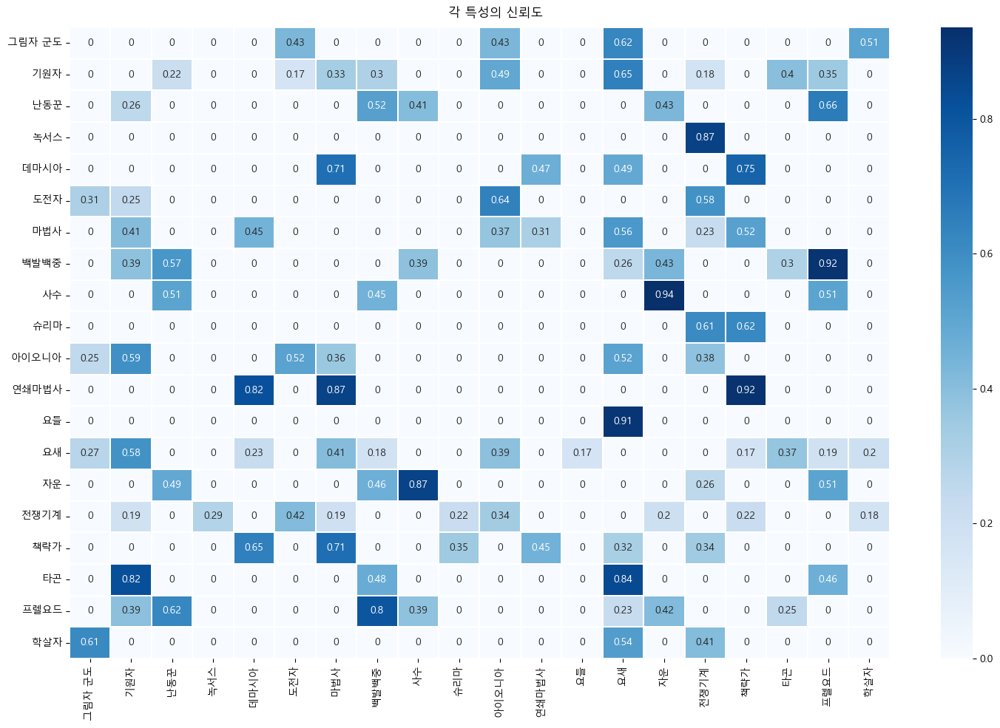

In [26]:
fig = plt.figure(figsize=(15, 10))
fig.suptitle("각 특성의 신뢰도", x=0.45)
ax = fig.add_subplot(1, 1, 1)
sns.heatmap(
    revised_rules_df,
    annot=True,
    ax=ax,
    cmap=sns.color_palette("Blues", as_cmap=True),
    linewidths=0.01,
)

plt.tight_layout()
plt.show()

In [27]:
rules_single.nlargest(10, columns="confidence")

,antecedents_str,consequents_str,confidence
68,사수,자운,0.935420
80,연쇄마법사,책략가,0.921798
66,백발백중,프렐요드,0.918566
83,요들,요새,0.912797
34,녹서스,전쟁기계,0.871862
69,자운,사수,0.867672
50,연쇄마법사,마법사,0.866596
87,타곤,요새,0.843258
23,타곤,기원자,0.824755
39,연쇄마법사,데마시아,0.818825


### 상관관계 분석


#### 유닛 코스트의 합, 유닛 개수의 합, 유닛 단계의 평균과 순위와의 상관관계 분석


In [28]:
# 선택한 열들에 대한 상관 분석 수행
correlation_matrix = revised_match_unit[
    ["cost_sum", "avg_tier", "unit_count", "placement"]
].corr()
correlation_matrix

,cost_sum,avg_tier,unit_count,placement
cost_sum,1.000000,0.486174,0.499034,-0.655925
avg_tier,0.486174,1.000000,-0.167824,-0.283002
unit_count,0.499034,-0.167824,1.000000,-0.490753
placement,-0.655925,-0.283002,-0.490753,1.000000


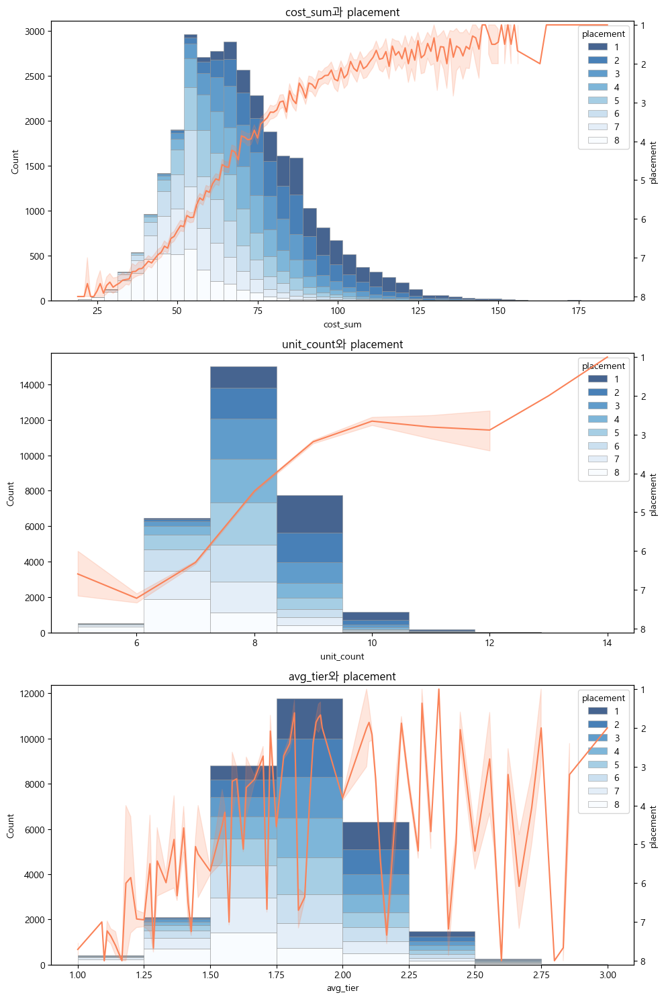

In [29]:
fig = plt.figure(figsize=(10, 15))
# cost_sum과 placement
ax1_1 = fig.add_subplot(3, 1, 1)
ax1_2 = ax1_1.twinx()
data = revised_match_unit.sort_values(["cost_sum", "placement"])
sns.histplot(
    revised_match_unit,
    x="cost_sum",
    hue="placement",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    bins=40,
    ax=ax1_1,
)
sns.lineplot(data=data, x="cost_sum", y="placement", color='#FA8258', ax=ax1_2)
ax1_1.set_title("cost_sum과 placement")
ax1_2.set_ylim(data["placement"].max() + 0.1, data["placement"].min() - 0.1)

# unit_count와 placement
ax2_1 = fig.add_subplot(3, 1, 2)
ax2_2 = ax2_1.twinx()
data = revised_match_unit.sort_values(["unit_count", "placement"])
sns.histplot(
    revised_match_unit,
    x="unit_count",
    hue="placement",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    bins=8,
    ax=ax2_1,
)

sns.lineplot(data=data, x="unit_count", y="placement", color='#FA8258', ax=ax2_2)
ax2_1.set_title("unit_count와 placement")
ax2_2.set_ylim(data["placement"].max() + 0.1, data["placement"].min() - 0.1)

# avg_tier와 placement
ax3_1 = fig.add_subplot(3, 1, 3)
ax3_2 = ax3_1.twinx()
data = revised_match_unit.sort_values(["avg_tier", "placement"])
sns.histplot(
    revised_match_unit,
    x="avg_tier",
    hue="placement",
    multiple="stack",
    palette=sns.color_palette("Blues_r", as_cmap=True),
    edgecolor="0.6",
    linewidth=0.4,
    log_scale=False,
    bins=8,
    ax=ax3_1,
)

sns.lineplot(data=data, x="avg_tier", y="placement", color='#FA8258', ax=ax3_2)
ax3_1.set_title("avg_tier와 placement")
ax3_2.set_ylim(data["placement"].max() + 0.1, data["placement"].min() - 0.1)

plt.tight_layout()
plt.show()

### 통계 분석

#### 각 유닛 조합의 등장 비율과 평균순위

In [39]:
# 가장 최신 버전의 match_player_id 리스트를 추출
latest_match_player = match.merge(preprocessed_match_player, how='inner', left_on='match_id', right_on='match_id')
latest_match_player = latest_match_player[
    (latest_match_player["version_major"] == 13)
    & (latest_match_player["version_minor"] == 15)
    & (latest_match_player["version_patch"] == 524)
]
latest_match_player_id = latest_match_player['match_player_id']

# 최신 버전에 사용된 유닛만 추출
latest_match_unit = revised_match_unit.loc[revised_match_unit['match_player_id'].isin(latest_match_player_id)]
# 슬라이싱
latest_match_unit = latest_match_unit.loc[:, ['name', 'placement']]

In [81]:
# df의 list_str 컬럼의 모든 조합에 대하여 numeric_str 컬럼의
# frequency와 frequency percentage, average, combination length를 계산하여 result_df를 반환합니다.
def calculate_combination_statistic(df, list_str, numeric_str):
    # 각 조합의 평균 순위와 빈도수를 저장할 defaultdict 초기화
    combo_data = defaultdict(lambda: {numeric_str: [], "count": 0})
    
    # 데이터프레임 순회하며 조합의 평균 순위와 빈도수 계산
    for index, row in df.iterrows():
        items = row[list_str]
        numeric = row[numeric_str]
    
        # 플레이어가 사용한 조합 추가
        combo = tuple(sorted(items))
        combo_data[combo][numeric_str].append(numeric)
        combo_data[combo]["count"] += 1
    
        # 조합의 부분집합들 추가
        for r in range(1, len(items)):
            for subset in combinations(items, r):
                subset_combo = tuple(sorted(subset))
                combo_data[subset_combo][numeric_str].append(numeric)
                combo_data[subset_combo]["count"] += 1
    
    # 각 조합 및 부분집합들의 평균 순위와 빈도수를 데이터프레임으로 변환
    result_data = []
    for combo, data in combo_data.items():
        avg_rank = sum(data[numeric_str]) / data["count"]
        percentage = data["count"] / len(df)
        result_data.append(
            {"combination": combo, "avg_rank": avg_rank, "frequency": data["count"],
             "percentage": percentage, "length" : len(combo)}
        )
    
    result_df = pd.DataFrame(result_data)
    return result_df

In [116]:
# 모든 조합의 통계를 계산
unit_combination_stat = calculate_combination_statistic(latest_match_unit, 'name', 'placement')
# 비율 1% 이하인 조합은 제외
limited_unit_combination_stat = unit_combination_stat.loc[unit_combination_stat['percentage'] > 0.01]
limited_unit_combination_stat

,combination,avg_rank,frequency,percentage,length
1,"(세트,)",4.600238,3357,0.135314,1
2,"(그웬,)",4.216690,3595,0.144907,1
3,"(쉔,)",4.375210,9512,0.383409,1
4,"(아트록스,)",3.481923,4868,0.196219,1
5,"(아리,)",3.844321,5203,0.209722,1
...,...,...,...,...,...
74868,"(럭스, 말자하, 스웨인, 아리, 자르반 4세, 타릭)",3.550129,389,0.015680,6
74904,"(럭스, 말자하, 벨코즈, 아리, 자르반 4세, 타릭)",3.542056,321,0.012939,6
74942,"(럭스, 말자하, 벨코즈, 스웨인, 아리, 자르반 4세, 타릭)",3.532508,323,0.013019,7
78702,"(그웬, 제드, 칼리스타)",4.818815,287,0.011568,3


In [118]:
# 점 그래프 생성
fig = px.scatter(
    limited_unit_combination_stat,
    x="percentage",
    y="avg_rank",
    size="percentage",
    color='length',
    hover_name="combination",
    title="각 조합의 등장 비율과 평균 순위",
    labels={
        "percentage": "비율",
        "avg_rank": "평균 순위",
        "length": "길이"
    },
    log_x=False,
    color_continuous_scale=px.colors.sequential.Jet,
    custom_data=["frequency", "percentage", "length"],
)

# 툴팁 추가
fig.update_traces(
    hovertemplate="<br>".join(
        [
            "<b>조합</b>: %{hovertext}<br>",
            "<b>평균 순위</b>: %{y:.4f}",
            "<b>빈도</b>: %{customdata[0]}",
            "<b>비율</b>: %{customdata[1]:.3%}",
            "<b>길이</b>: %{customdata[2]}"
        ]
    )
)

# 그래프 출력 사이즈 조절
fig.update_layout(
    width=1100,  # 너비
    height=800,  # 높이
    hovermode='closest'  # 가장 가까운 데이터 포인트의 툴팁 표시
)
# 그래프 표시
fig.show()

#### 조합 길이 별 Top 5

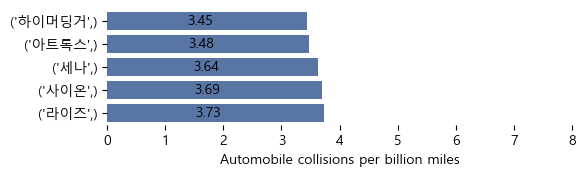

In [148]:
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 1.5))

data=limited_unit_combination_stat[limited_unit_combination_stat['length']==1].nsmallest(5, 'avg_rank')
# Plot the total crashes
sns.set_color_codes('deep')
ax1 = sns.barplot(x="avg_rank", y="combination",
            data=data,
            label="Total", color="b")

# Plot the total crashes
# sns.set_color_codes('deep')
# sns.barplot(x="avg_rank", y="combination",
#             data=limited_unit_combination_stat[limited_unit_combination_stat['length']==1].nsmallest(5, 'avg_rank'),
#             label="Total", color="b")

# percentage 정보를 막대 가운데에 표시
for i, p in enumerate(ax1.patches):
    percentage_value = data.iloc[i]['avg_rank']  # 해당 막대의 폭 값을 퍼센트 정보로 사용
    ax1.annotate(f'{percentage_value:.2f}',  # 소수점 두 자리까지 표시
                (p.get_x() + p.get_width() / 2., p.get_y() + p.get_height() / 2.),
                ha='center', va='center',
                xytext=(-5, 0),  # 텍스트 위치 조정
                textcoords='offset points',
)

# Add a legend and informative axis label
# ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(0, 8), ylabel="",
       xlabel="Automobile collisions per billion miles")
sns.despine(left=True, bottom=True)

In [128]:
limited_unit_combination_stat[limited_unit_combination_stat['length']==1].nlargest(5, 'avg_rank')

,combination,avg_rank,frequency,percentage,length
2853,"(티모,)",5.195436,1709,0.068886,1
2849,"(트리스타나,)",5.086181,673,0.027127,1
8821,"(바이,)",5.041645,1921,0.077432,1
24954,"(진,)",5.039900,401,0.016163,1
5088,"(레넥톤,)",5.010705,1121,0.045185,1


In [140]:
data.iloc[0]['percentage']

0.3191986778991495